In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1, 2, 0).squeeze())
  plt.show()



#Generator

In [2]:
def get_generator_block(input_dim,output_dim):
  return nn.Sequential(
      nn.Linear(input_dim,output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True)
  )

## checking generator block


In [3]:
def test_gen_block(in_features,out_features, num_test=1000):
  block = get_generator_block(in_features,out_features)

  assert len(block) == 3
  assert type(block[0]) == nn.Linear
  assert type(block[1]) == nn.BatchNorm1d
  assert type(block[2]) == nn.ReLU

  test_input = torch.randn(num_test,in_features)
  test_output = block(test_input)
  assert test_output.shape == torch.Size([num_test,out_features])
  assert test_output.std() > 0.55
  assert test_output.std() < 0.65

test_gen_block(25,12)
test_gen_block(15,28)


##building the generator class

In [4]:
class Generator(nn.Module):
  def __init__(self,z_dim=10,image_dim=784,hidden_dim=128):
    super(Generator,self).__init__()
    self.gen = nn.Sequential(
        get_generator_block(z_dim,hidden_dim),
        get_generator_block(hidden_dim,hidden_dim*2),
        get_generator_block(hidden_dim*2,hidden_dim*4),
        get_generator_block(hidden_dim*4,hidden_dim*8),
        nn.Linear(hidden_dim*8,image_dim),
        nn.Sigmoid()
    )
  def forward(self, noise):

        return self.gen(noise)

    # Needed for grading
  def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


#Noise


In [6]:
#getting noise
def get_noise(n_samples,z_dim,device='cpu'):
  return torch.randn(n_samples,z_dim,device=device)

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)

    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


#Discriminator

In [8]:
def get_discriminator_block(input_dim,output_dim):
  return nn.Sequential(
      nn.Linear(input_dim,output_dim),
      nn.LeakyReLU(0.2,inplace=True)
  )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


##Discriminator class

In [10]:
class Discriminator(nn.Module):
  def __init__(self,image_dim=784,hidden_dim=128):
    super(Discriminator,self).__init__()
    self.disc = nn.Sequential(
        get_discriminator_block(image_dim,hidden_dim*4),
        get_discriminator_block(hidden_dim*4,hidden_dim*2),
        get_discriminator_block(hidden_dim*2,hidden_dim),
        nn.Linear(hidden_dim,1),
    )
  def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

    # Needed for grading
  def get_disc(self):

      return self.disc


In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cpu'

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 16484312.61it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 493804.57it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 4532469.60it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 8964954.71it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [14]:
def get_disc_loss(gen,disc,criterion,real,num_images,z_dim,device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [15]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [16]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images.
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [17]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)


def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)

    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3944899326562867, discriminator loss: 0.4179588736295697


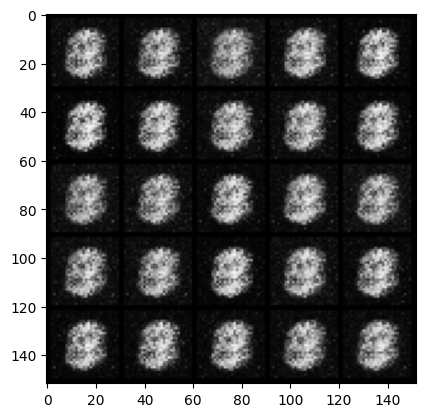

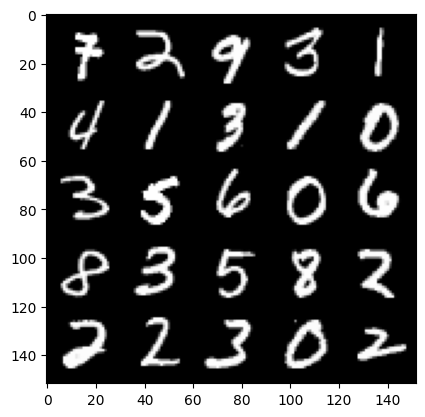

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7528377299308782, discriminator loss: 0.2790954212844371


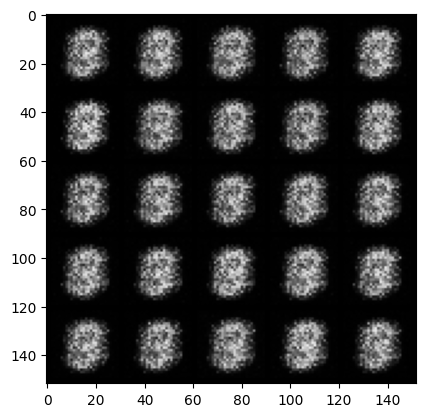

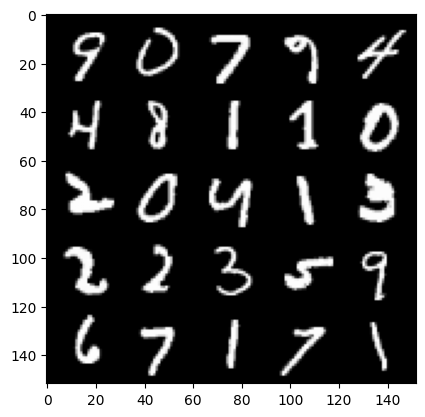

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.051194058656695, discriminator loss: 0.1602869480699301


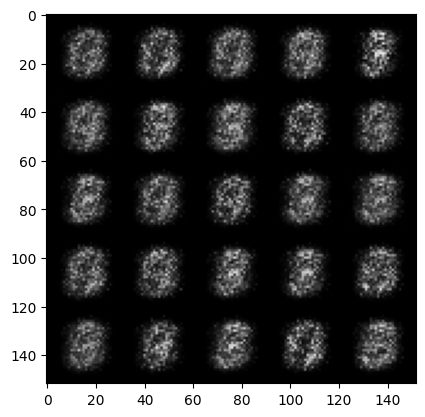

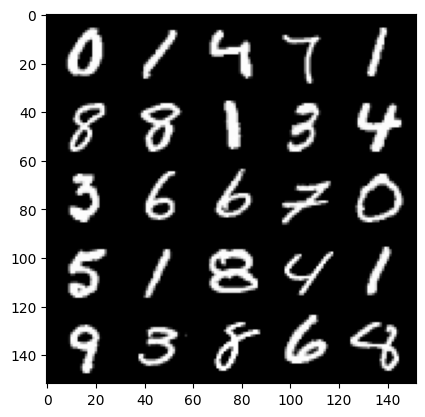

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6738428478240974, discriminator loss: 0.2247202310562134


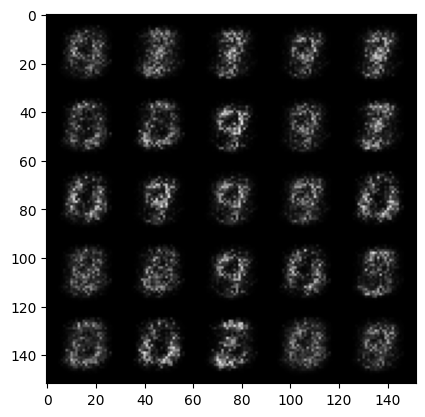

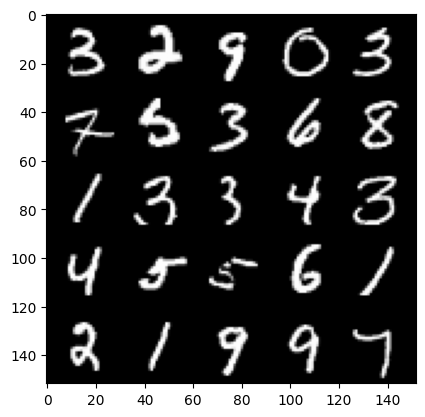

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.6602433912754087, discriminator loss: 0.2073884169757367


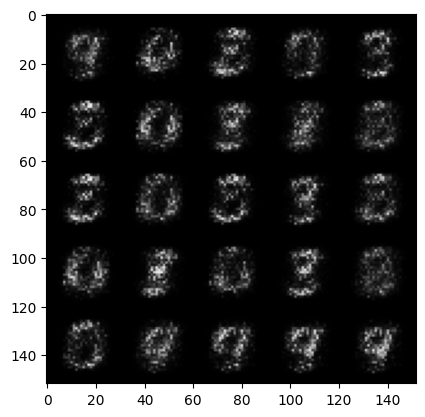

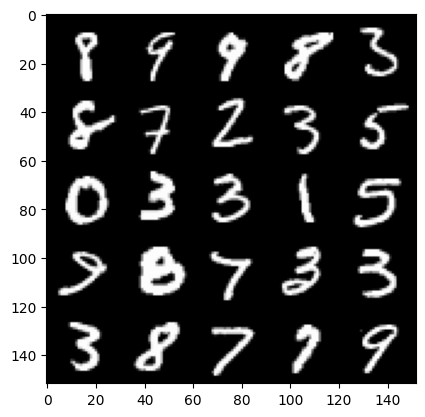

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.913315482616426, discriminator loss: 0.17255910328030602


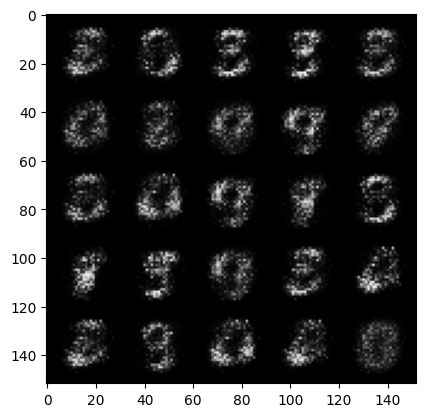

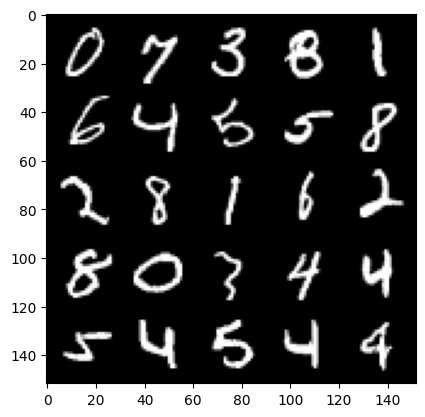

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.2292023622989645, discriminator loss: 0.147698472097516


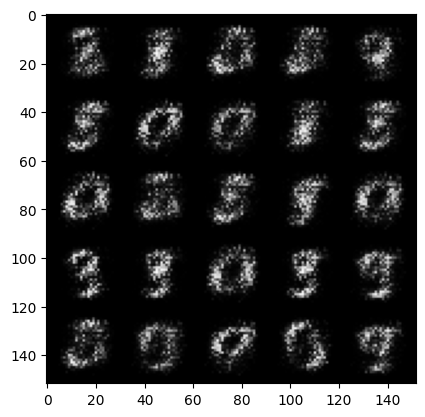

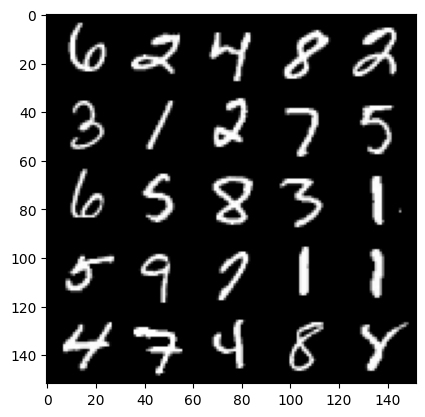

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.742148028850556, discriminator loss: 0.11171034812927236


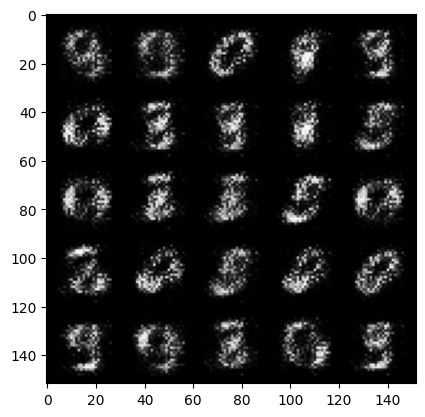

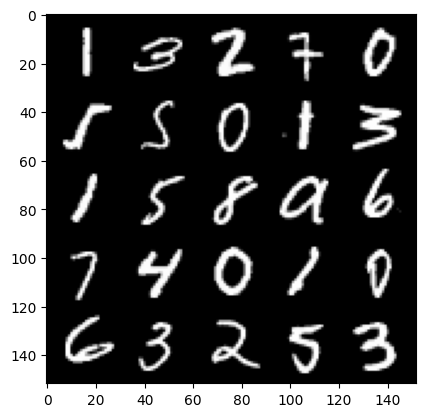

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.163135898113246, discriminator loss: 0.08736950063705447


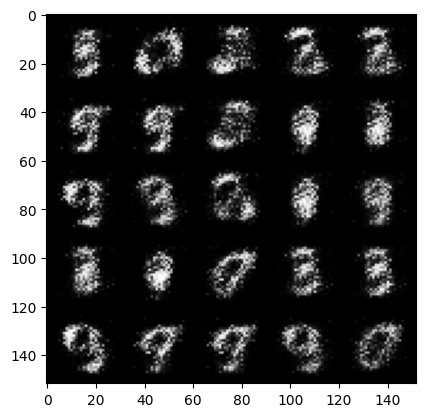

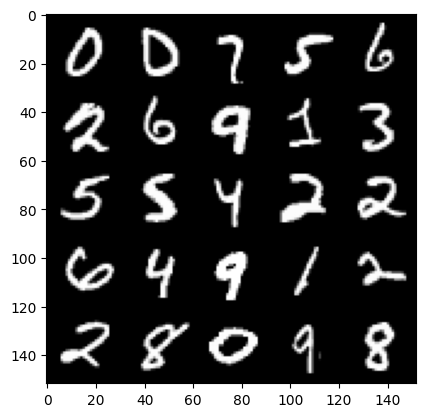

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.4672807869911195, discriminator loss: 0.0685065122842789


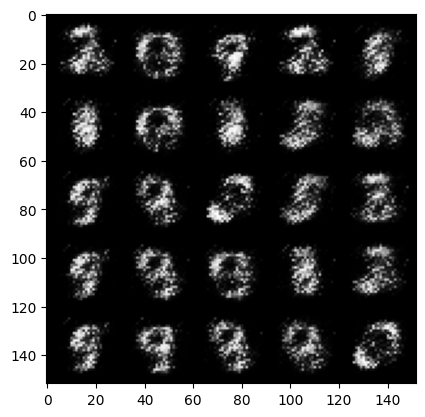

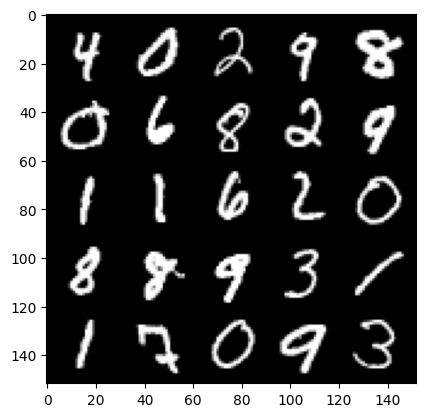

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.712541075229646, discriminator loss: 0.058525449022650736


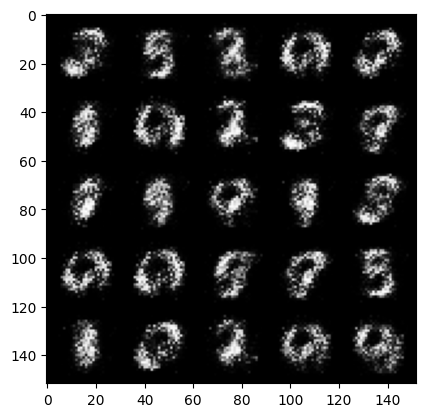

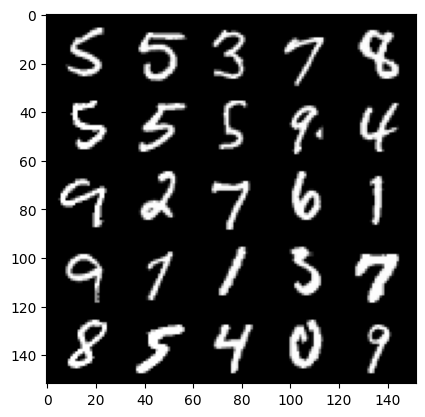

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.00013365077972, discriminator loss: 0.05342532685026525


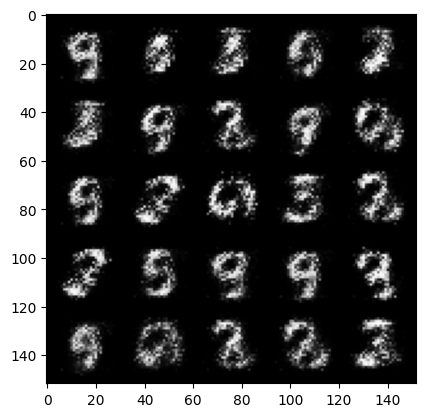

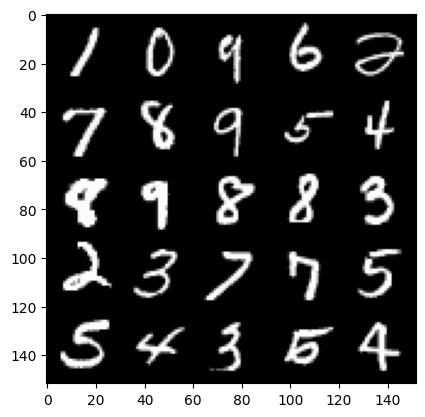

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.088716150283809, discriminator loss: 0.04796518200635902


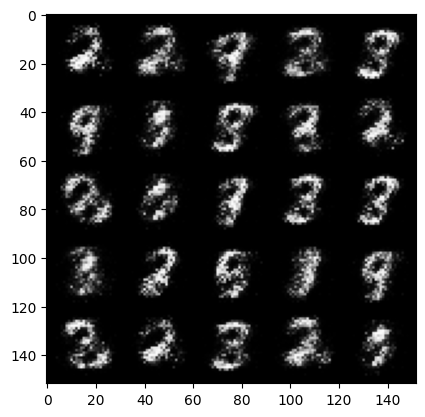

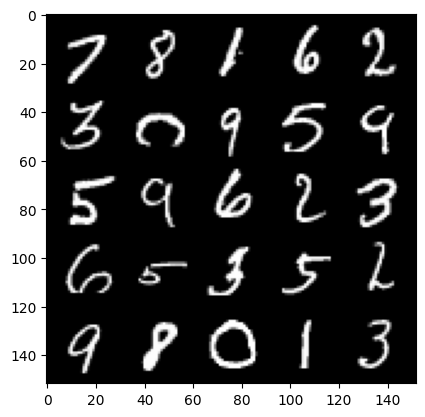

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.223847508430479, discriminator loss: 0.048830102026462534


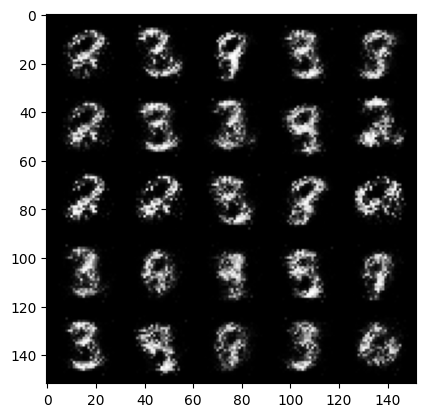

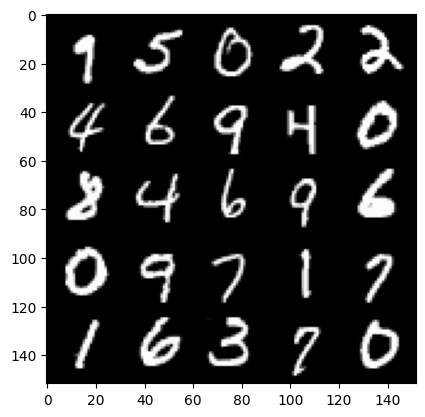

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.349332772254944, discriminator loss: 0.044655181746929895


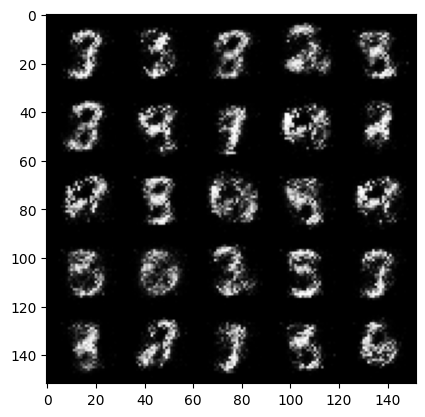

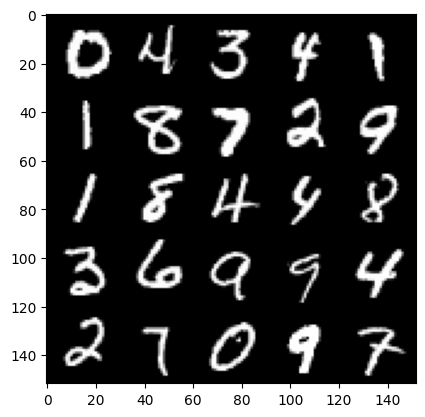

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.515369934558868, discriminator loss: 0.047511589456349576


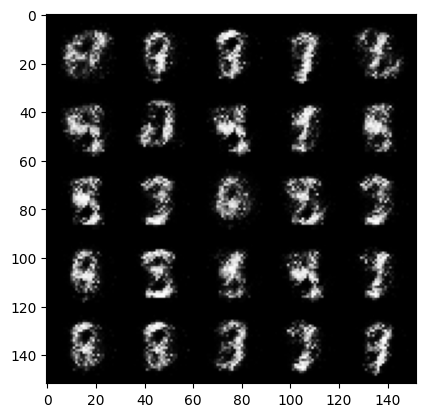

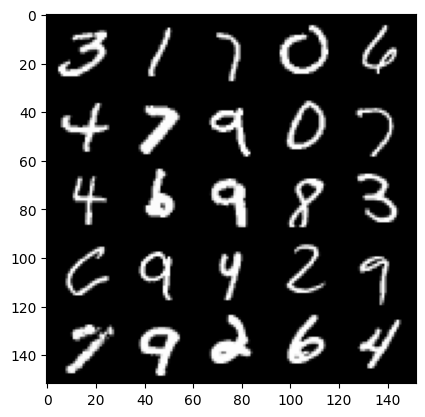

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.420151259899141, discriminator loss: 0.053808838449418556


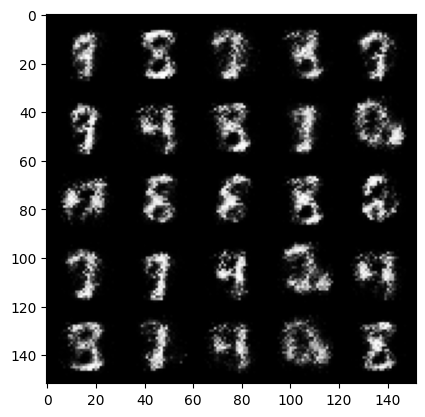

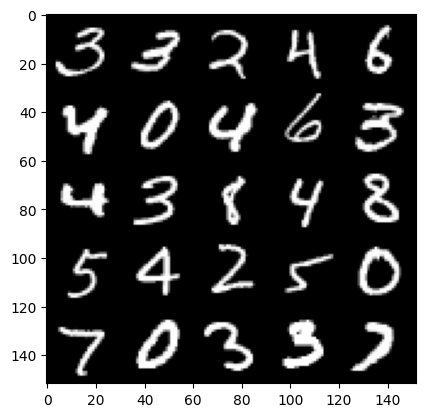

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.28020647573471, discriminator loss: 0.04981317543983461


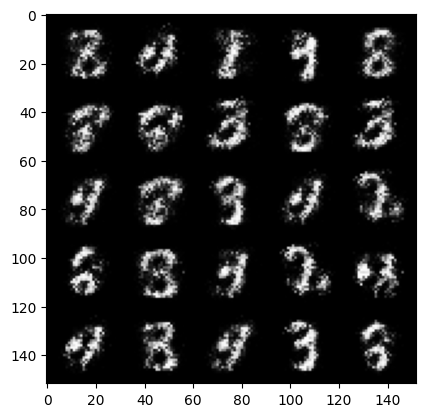

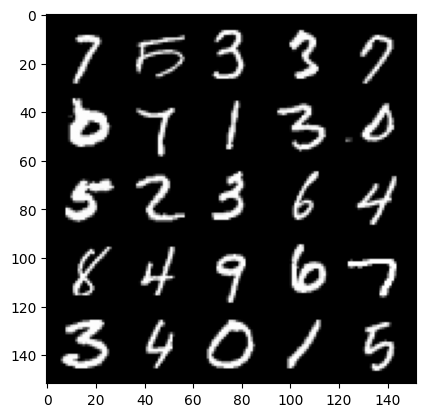

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.570917243003844, discriminator loss: 0.04592660571634768


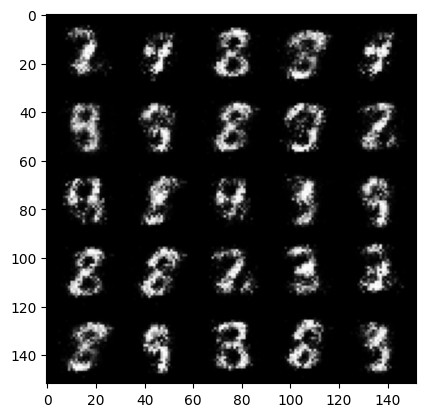

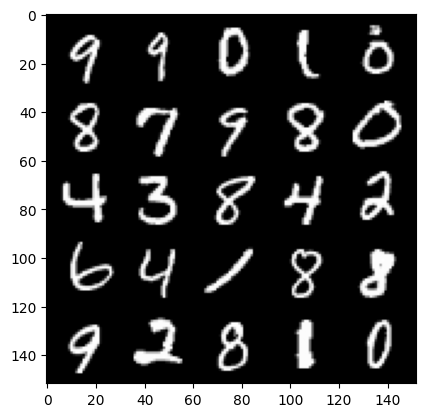

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.261631112098695, discriminator loss: 0.05302399627864362


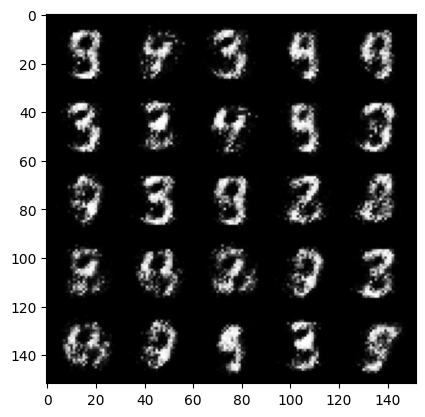

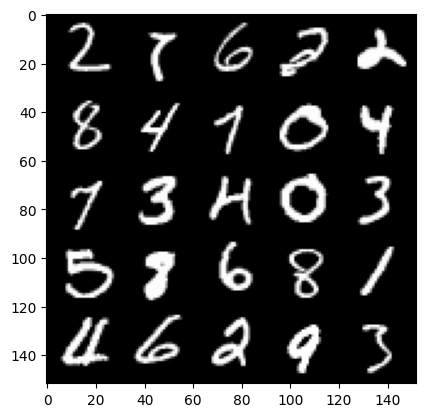

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.3467668576240515, discriminator loss: 0.058273521065711986


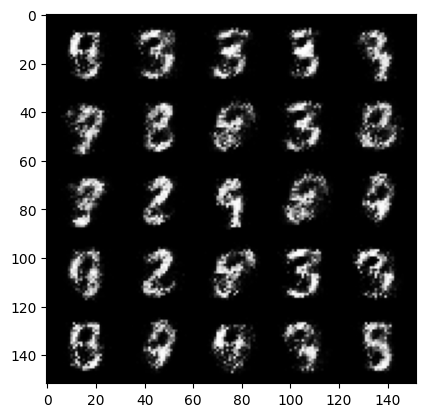

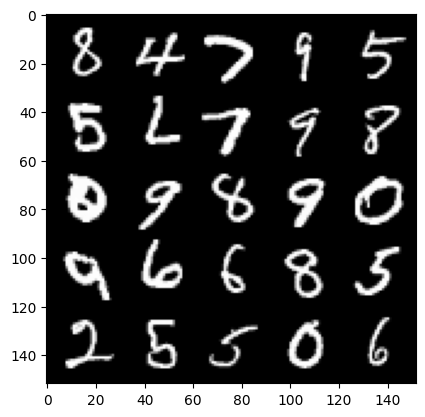

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.298209253311155, discriminator loss: 0.06036001525074246


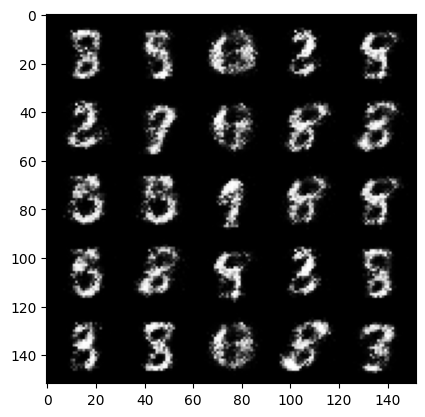

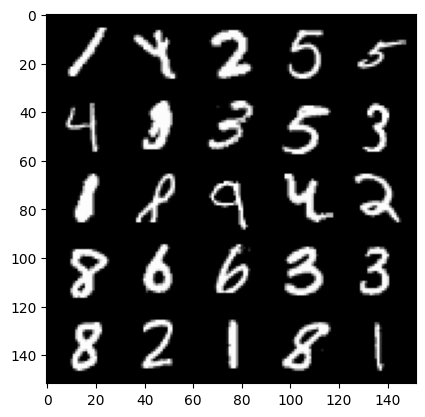

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.122443540573121, discriminator loss: 0.07209395254403353


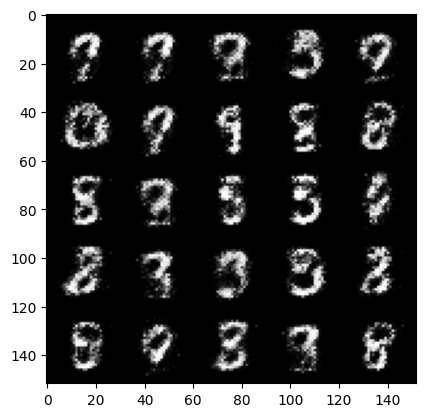

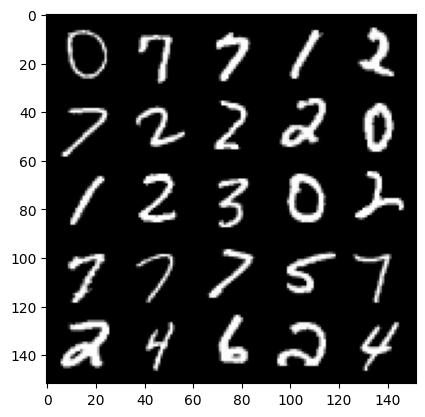

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.0413456683158895, discriminator loss: 0.07744392815232283


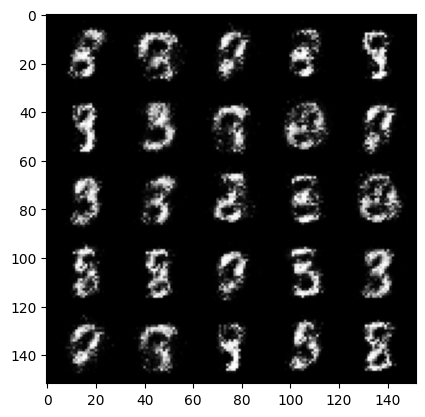

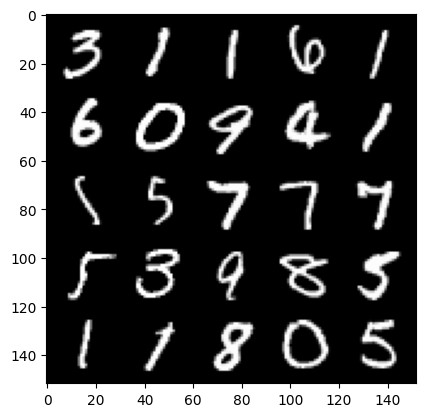

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.997386049747474, discriminator loss: 0.0809549602866173


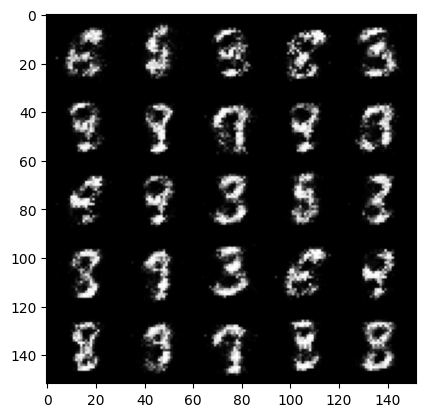

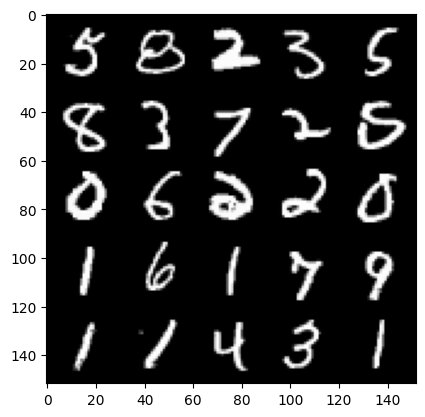

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.058590470790861, discriminator loss: 0.083804829671979


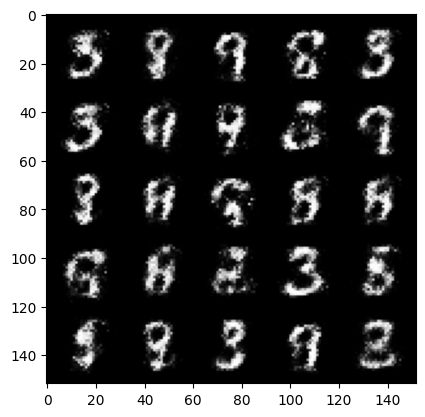

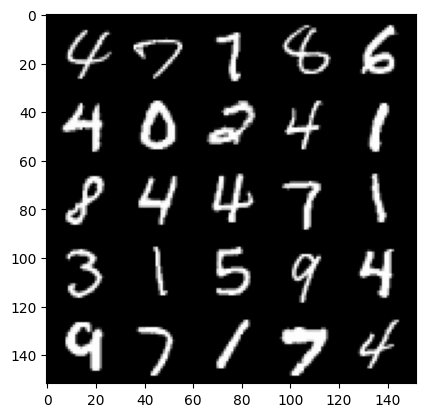

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.9058814420700076, discriminator loss: 0.0993733337521554


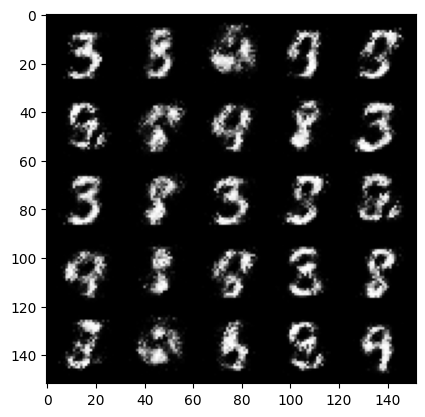

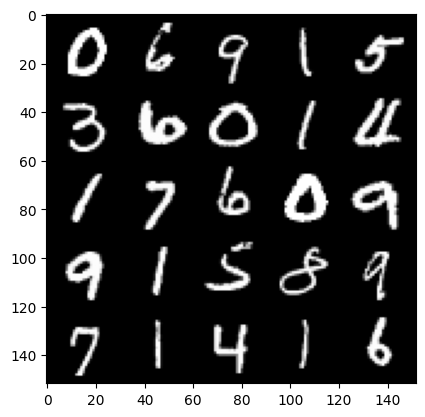

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.8405069293975846, discriminator loss: 0.0981318032518029


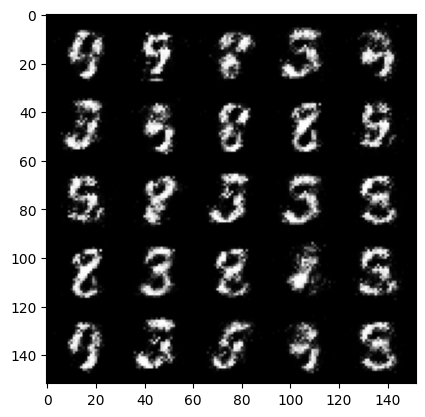

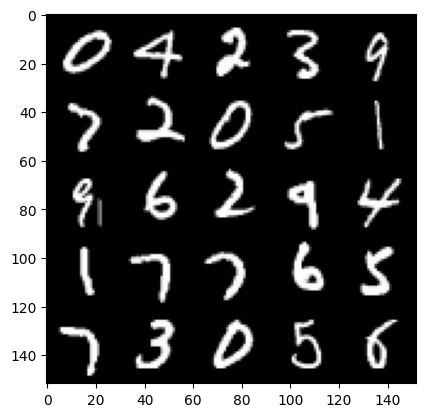

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.885811283588407, discriminator loss: 0.09081095808744438


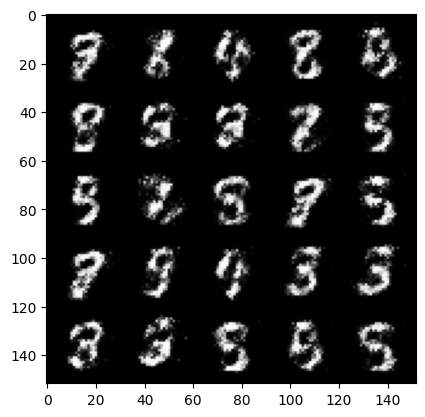

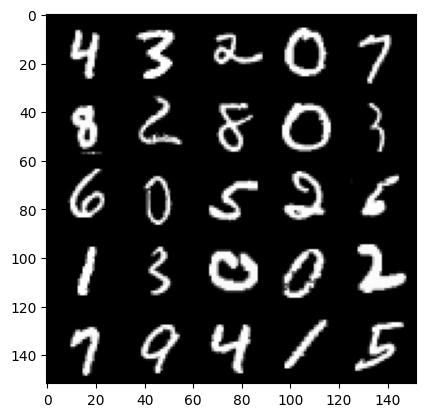

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.979964047908782, discriminator loss: 0.08911760535091164


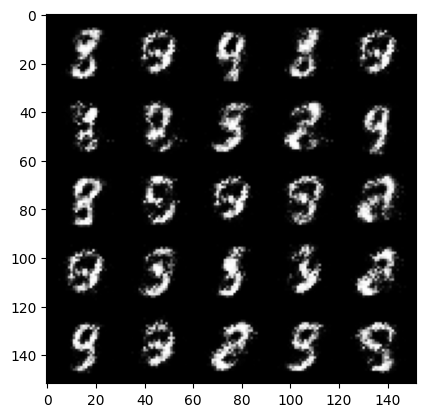

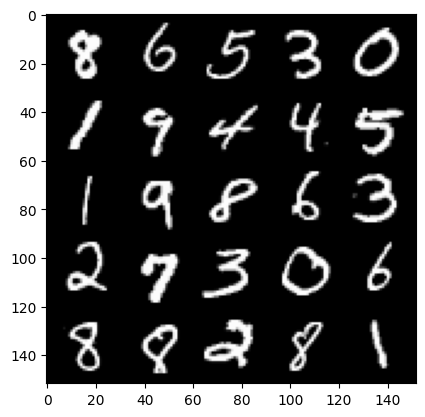

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.8304840130805937, discriminator loss: 0.11124832575768241


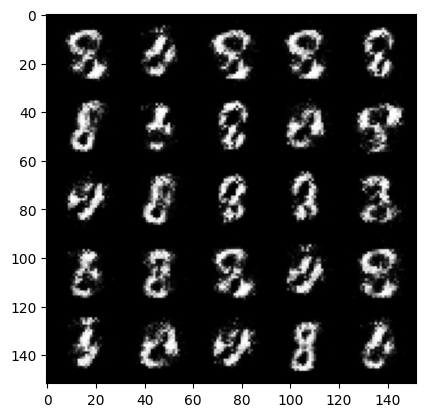

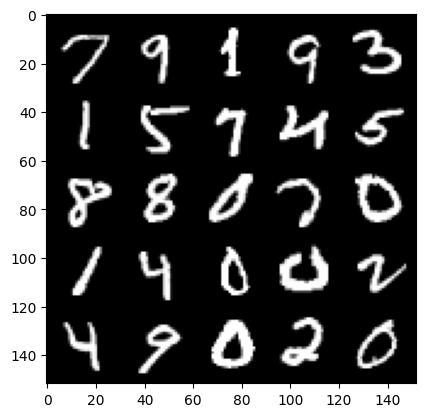

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.862407694339753, discriminator loss: 0.10987535944581031


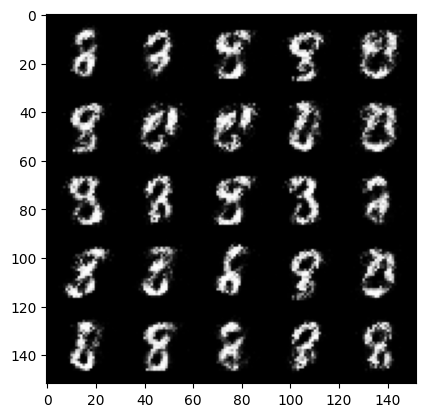

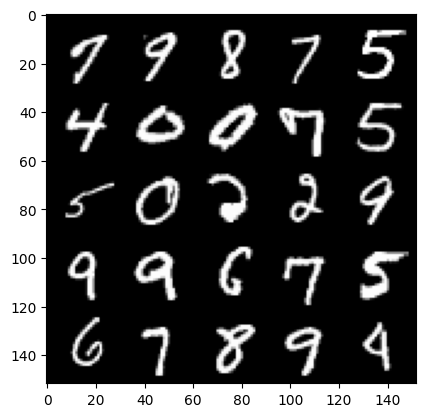

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.795960840702054, discriminator loss: 0.11475723487138743


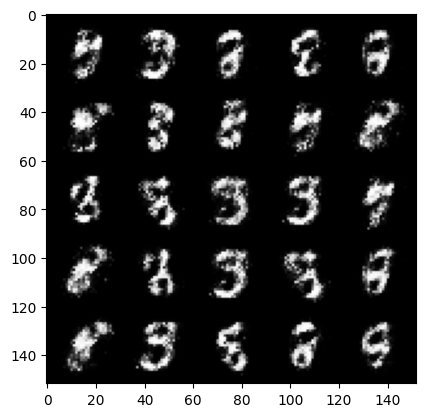

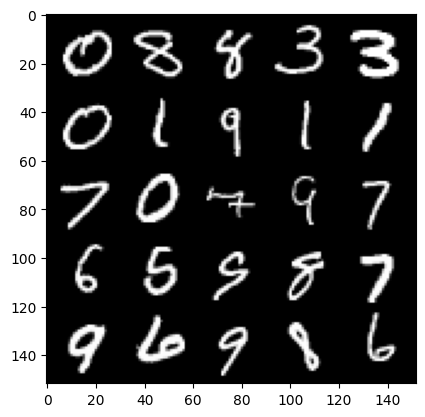

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.8176072082519505, discriminator loss: 0.1257803721949458


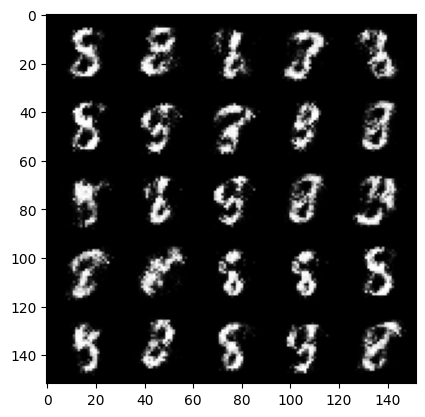

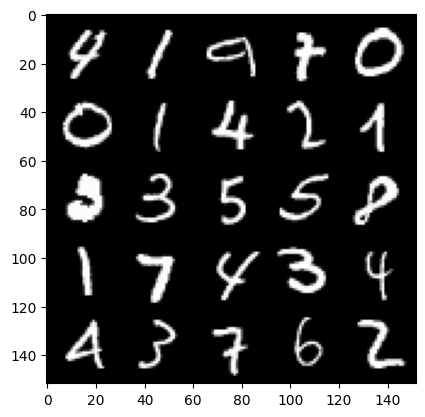

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.7127559542655972, discriminator loss: 0.13083129151165493


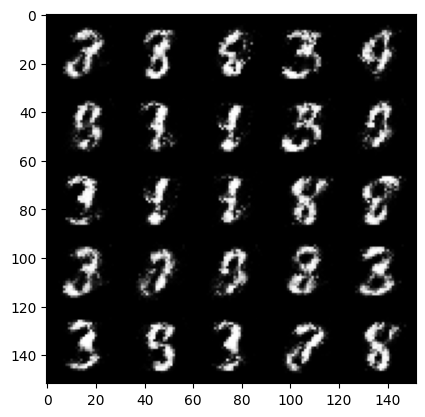

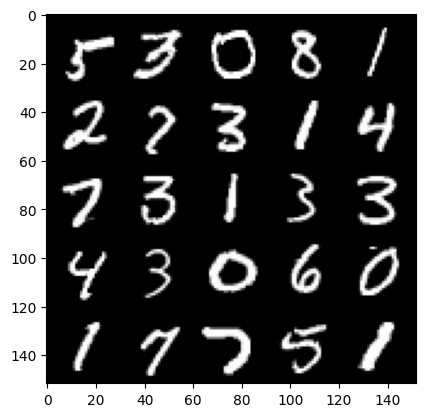

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.3995418515205387, discriminator loss: 0.14784553600847716


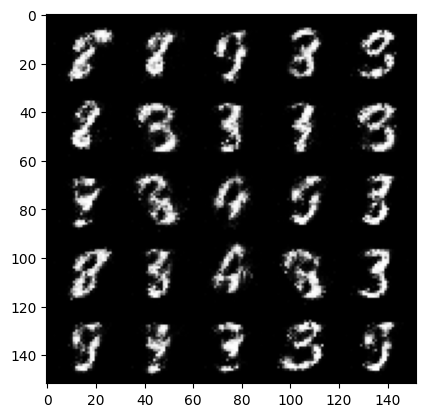

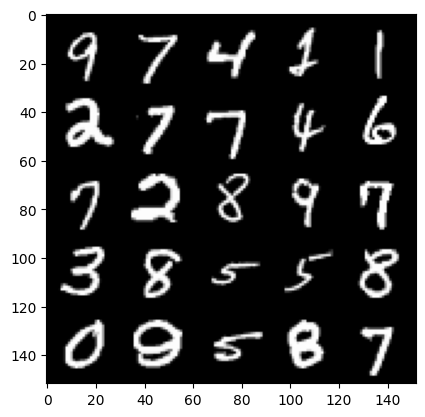

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.271243377208708, discriminator loss: 0.15090229959785947


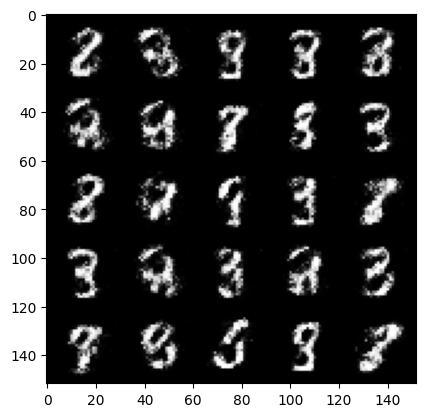

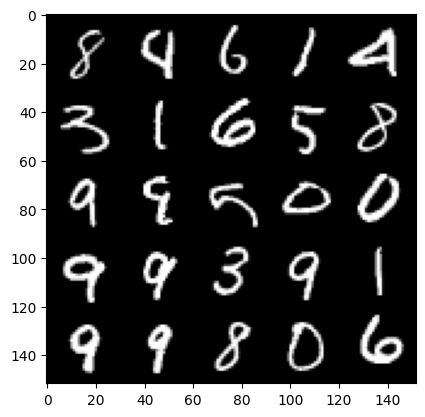

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.365252866745, discriminator loss: 0.146835523545742


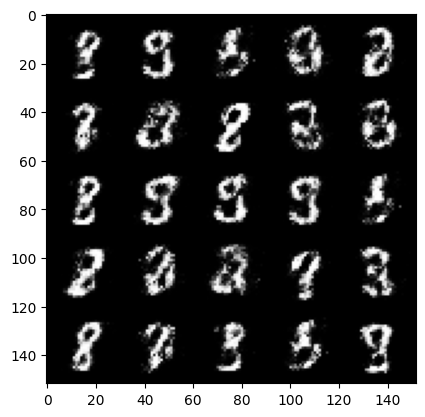

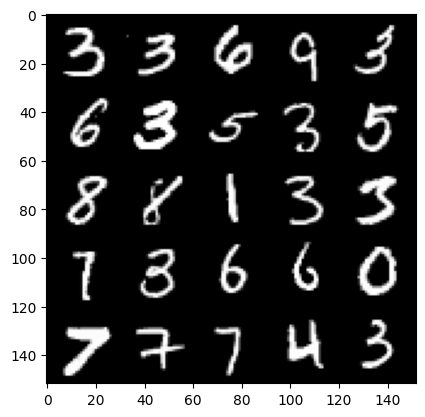

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.440106577396392, discriminator loss: 0.1413707354366779


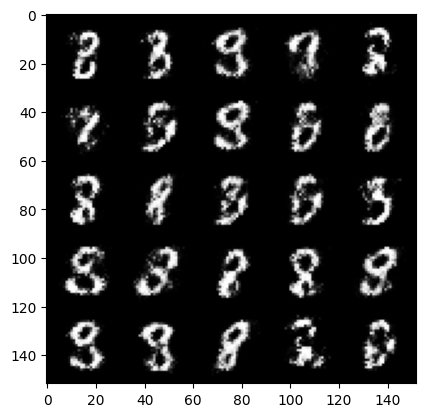

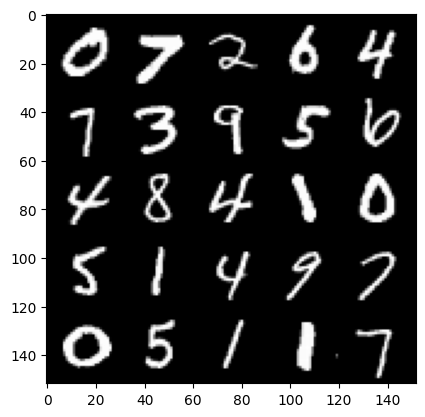

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.316711956501008, discriminator loss: 0.14725780954957007


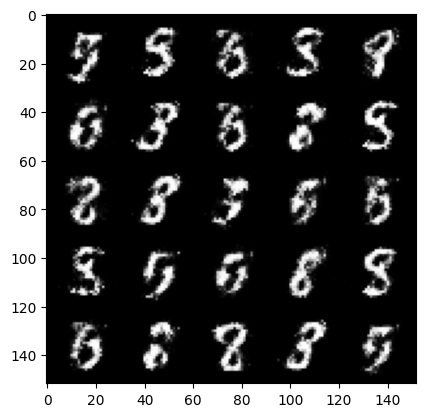

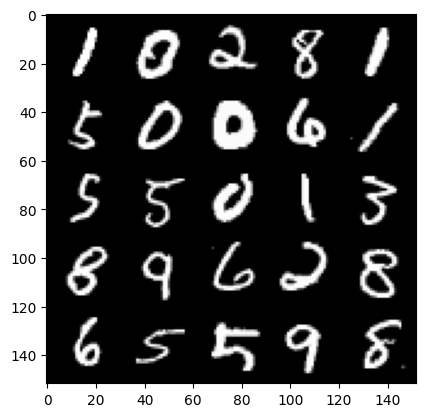

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.2835797491073597, discriminator loss: 0.15272842444479465


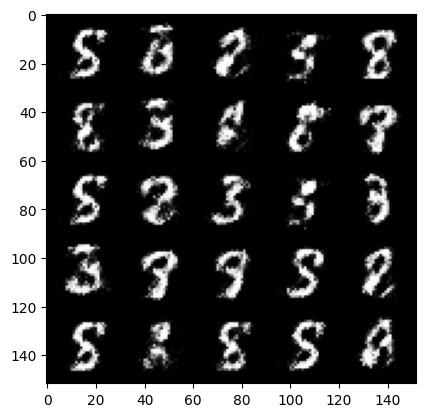

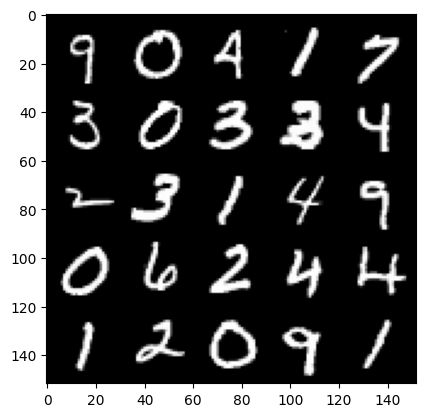

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.2192871260643017, discriminator loss: 0.14570952150225627


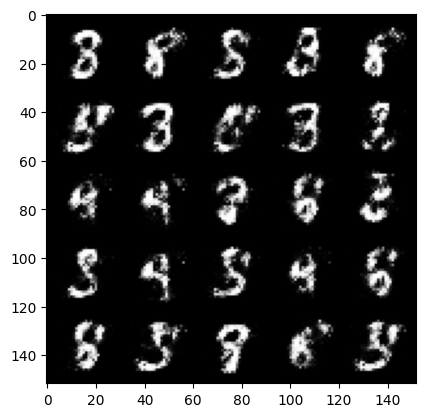

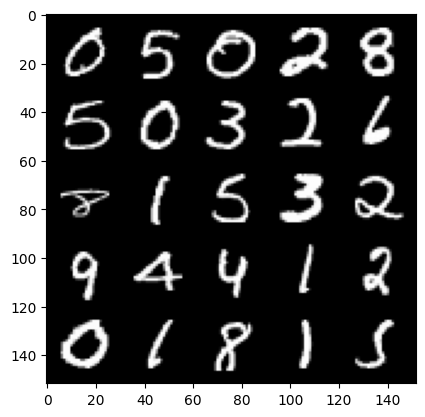

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.1372940549850465, discriminator loss: 0.16628324371576308


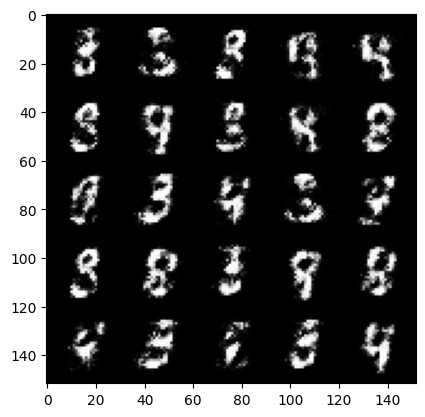

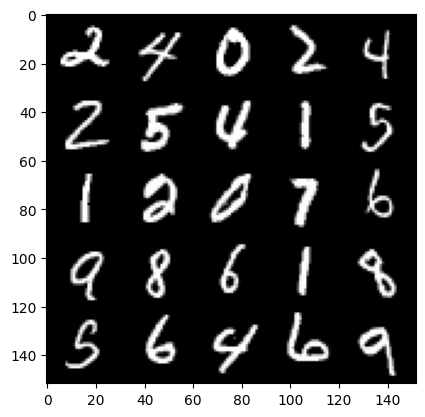

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.012629618644714, discriminator loss: 0.17215359643101694


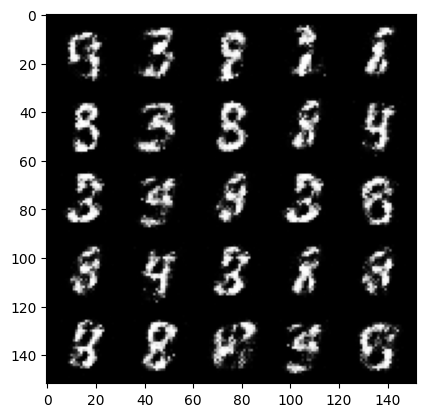

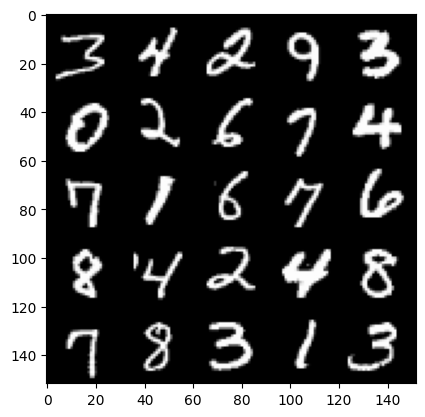

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1